<a href="https://colab.research.google.com/github/Rizwanali324/Images_preprocessing/blob/main/canny_Edges_Detectoin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Canny Edge Detector:**

The Canny edge detector is a popular edge detection algorithm that was developed by John F. Canny in 1986. It is widely used in computer vision and image processing due to its effectiveness in detecting edges while minimizing false positives. The Canny edge detector operates through several stages, including smoothing, gradient calculation, non-maximum suppression, and hysteresis thresholding.

**Use Cases and Applications:**

1. **Object Recognition:**
   - Canny edge detection is commonly used in object recognition tasks. It helps identify the boundaries of objects in images, facilitating the extraction of features for recognition.

2. **Image Segmentation:**
   - Canny edge detection is used in image segmentation to separate different regions based on the presence of edges. This is particularly useful in medical image analysis.

3. **Robotics and Autonomous Vehicles:**
   - In robotics and autonomous vehicles, Canny edge detection aids in detecting obstacles, road boundaries, and other critical features for navigation.

4. **Quality Inspection:**
   - Canny edge detection is applied in quality inspection processes, where detecting defects or boundaries in products is essential.

5. **Biomedical Image Analysis:**
   - In medical imaging, Canny edge detection helps identify structures and boundaries in images, contributing to tasks such as tumor detection.

**Advantages:**

1. **Good Localization:**
   - Canny provides accurate localization of edges, meaning it can pinpoint the exact location of the edges in an image.

2. **Low False Positive Rate:**
   - The non-maximum suppression step helps reduce false positives, making Canny suitable for applications where precision is crucial.

3. **Multistage Approach:**
   - The multistage approach involving Gaussian smoothing, gradient calculation, and hysteresis thresholding contributes to robust edge detection.

4. **Flexible Parameterization:**
   - Canny allows for flexible parameterization, allowing users to adjust parameters such as the Gaussian kernel size and threshold values.

**Disadvantages:**

1. **Computationally Expensive:**
   - Canny edge detection involves several computational steps, including convolutions with Gaussian kernels and gradient calculations, making it computationally more expensive than simpler operators.

2. **Parameter Tuning Required:**
   - Choosing appropriate parameter values (e.g., the standard deviation of the Gaussian, high and low thresholds) can be challenging and often requires tuning based on the characteristics of the images.

3. **Sensitive to Noise:**
   - Canny edge detection can be sensitive to noise, and preprocessing steps like Gaussian smoothing are often required to mitigate this sensitivity.

**Conclusion:**

The Canny edge detector is a versatile and widely used method that excels in scenarios where accurate edge localization and low false positive rates are crucial. While it has some computational costs and requires parameter tuning, its effectiveness in various applications makes it a popular choice in computer vision and image processing.

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.image as mpimg



import os
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim



Class: train
Total Count in 'train': 432

Class: test
Total Count in 'test': 109

Grand Total Count: 541


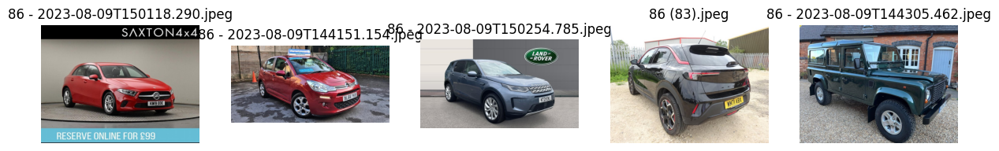

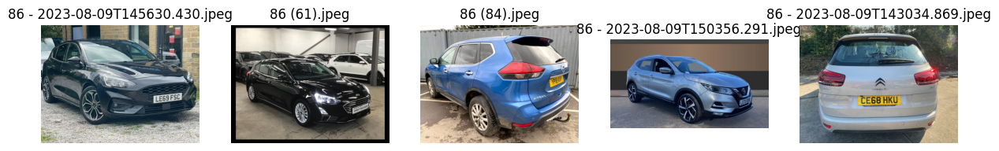

In [13]:

# Main path to the folder containing subfolders
main_path = '/content/drive/MyDrive/cars'

# List all subfolders
subfolders = [f for f in os.listdir(main_path) if os.path.isdir(os.path.join(main_path, f))]

# Initialize grand total count
grand_total_count = 0

# Loop through each subfolder
for subfolder in subfolders:
    subfolder_path = os.path.join(main_path, subfolder)

    # List all image files in the subfolder
    image_files = [f for f in os.listdir(subfolder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Get 5 random images from the subfolder
    random_images = random.sample(image_files, min(5, len(image_files)))

    # Display 5 random images from the subfolder in rows
    print(f"\nClass: {subfolder}")
    total_count = 0
    num_images_per_row = 5
    num_rows = -(-len(random_images) // num_images_per_row)  # Ceiling division
    fig, axs = plt.subplots(num_rows, num_images_per_row, figsize=(15, num_rows * 3))

    for i, img_file in enumerate(random_images):
        img_path = os.path.join(subfolder_path, img_file)
        img = mpimg.imread(img_path)

        # If only one row, axs is a 1D array; otherwise, it's a 2D array
        if num_rows == 1:
            axs[i % num_images_per_row].imshow(img)
            axs[i % num_images_per_row].set_title(img_file)
            axs[i % num_images_per_row].axis('off')
        else:
            axs[i // num_images_per_row, i % num_images_per_row].imshow(img)
            axs[i // num_images_per_row, i % num_images_per_row].set_title(img_file)
            axs[i // num_images_per_row, i % num_images_per_row].axis('off')

    # Print the total count of images in the subfolder
    total_count = len(image_files)
    print(f"Total Count in '{subfolder}': {total_count}")

    # Update the grand total count
    grand_total_count += total_count

# Print the grand total count
print(f"\nGrand Total Count: {grand_total_count}")

# Show the plots
plt.show()



Class: train


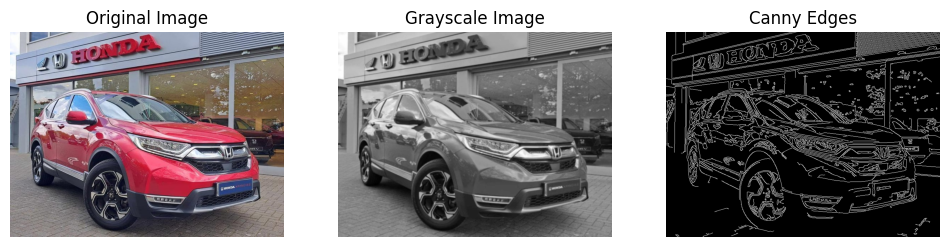

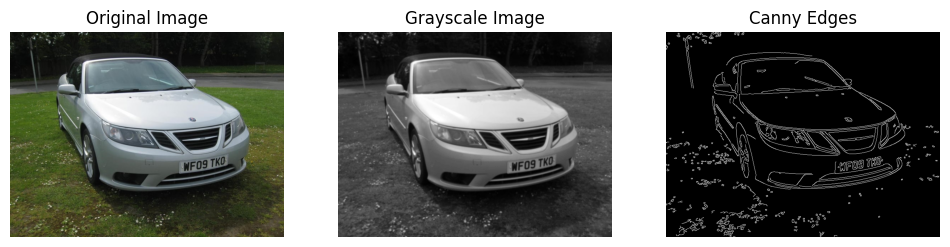

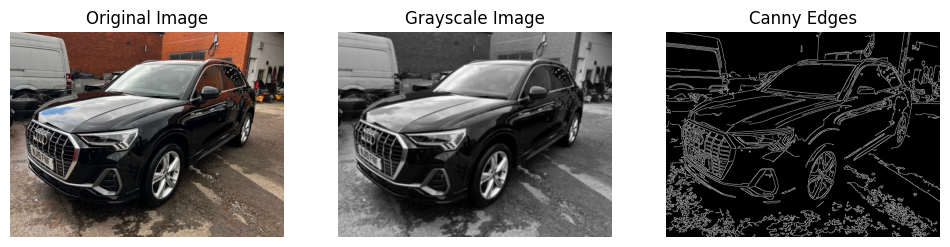

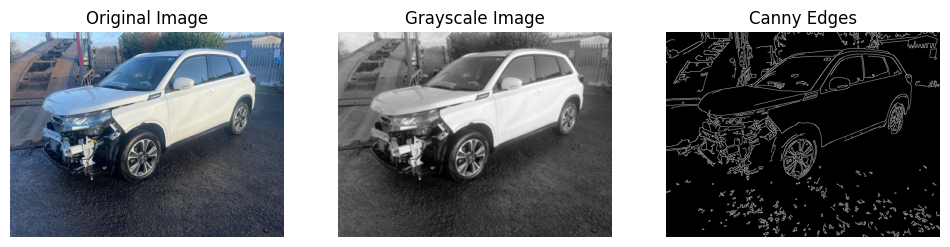

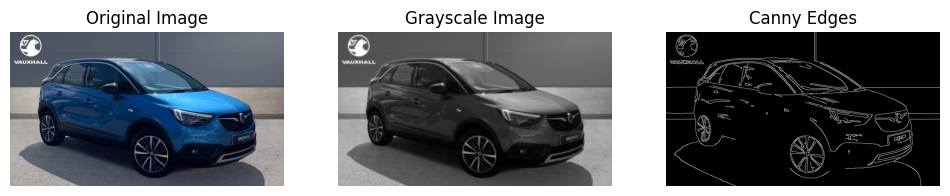


Class: test


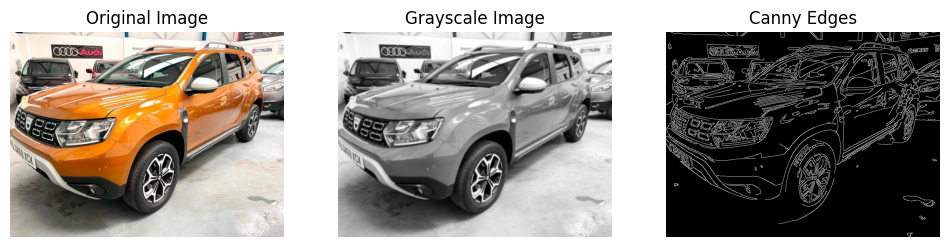

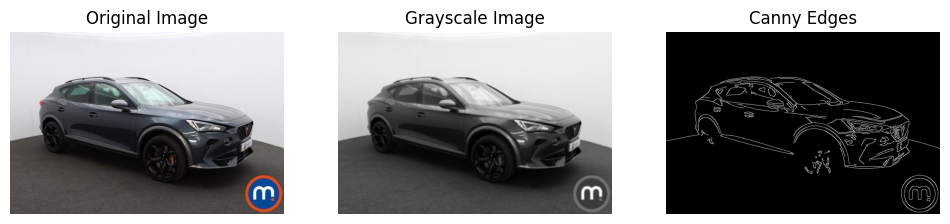

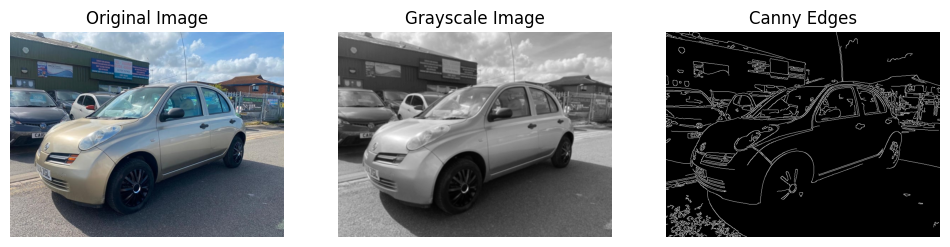

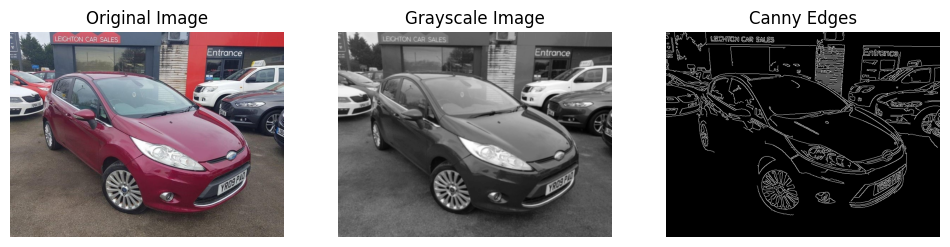

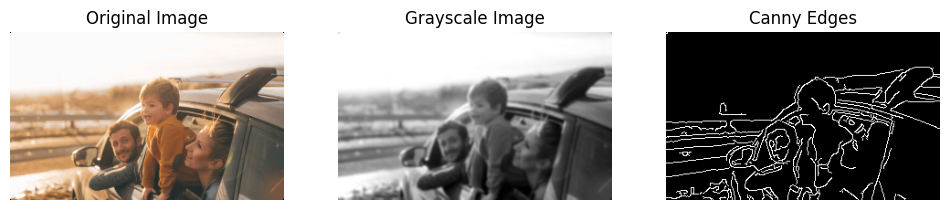

In [17]:


# Function for Canny edge detection
def apply_canny_edge_detection(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve edge detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Display the original image
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    # Display the grayscale image
    plt.subplot(1, 3, 2)
    plt.imshow(blurred, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')

    # Apply Canny edge detection
    edges = cv2.Canny(blurred, 50, 150)

    # Display the Canny edges
    plt.subplot(1, 3, 3)
    plt.imshow(edges, cmap='gray')
    plt.title('Canny Edges')
    plt.axis('off')

    plt.show()

    return edges

# Main path to the folder containing subfolders
main_path = '/content/drive/MyDrive/cars'

# List all subfolders
subfolders = [f for f in os.listdir(main_path) if os.path.isdir(os.path.join(main_path, f))]

# Loop through each subfolder
for subfolder in subfolders:
    subfolder_path = os.path.join(main_path, subfolder)

    # List all image files in the subfolder
    image_files = [f for f in os.listdir(subfolder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Get 5 random images from the subfolder
    random_images = random.sample(image_files, min(5, len(image_files)))

    # Display original and intermediate steps of Canny detection for 5 random images from the subfolder
    print(f"\nClass: {subfolder}")
    for img_file in random_images:
        img_path = os.path.join(subfolder_path, img_file)
        img = cv2.imread(img_path)

        # Apply Canny edge detection and display intermediate steps
        edges = apply_canny_edge_detection(img)


# Remove unwanted detection using marpholigi


Class: train


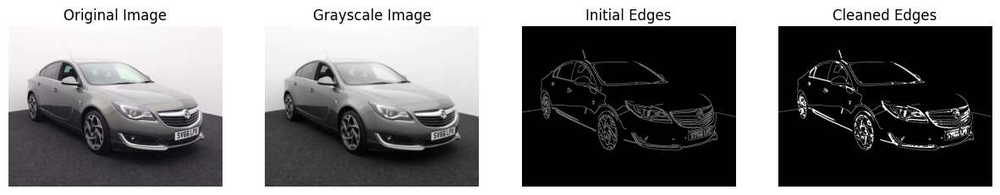

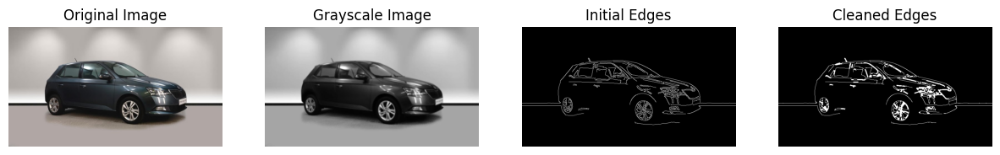

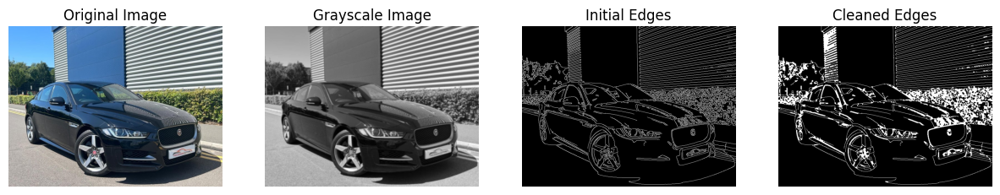

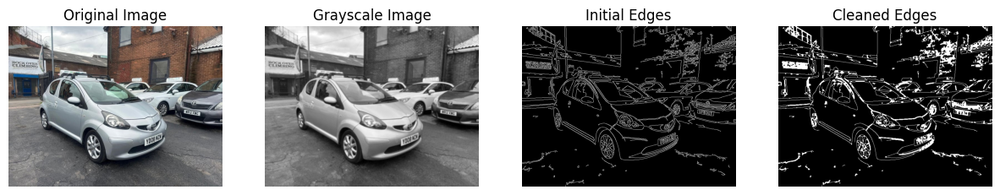

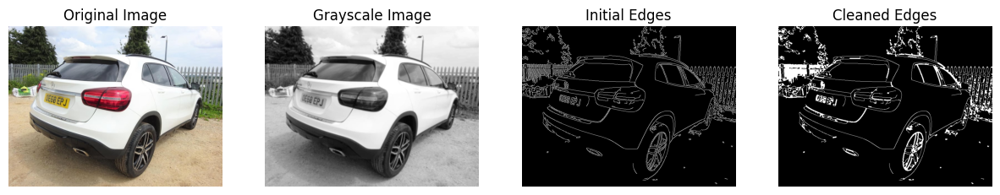


Class: test


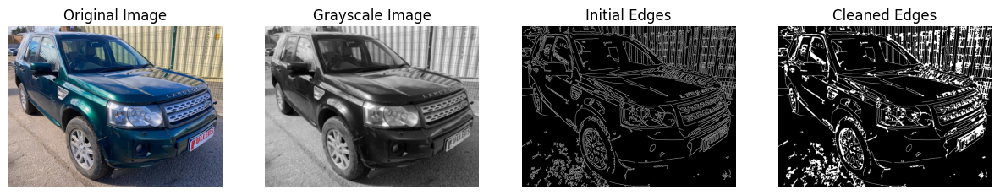

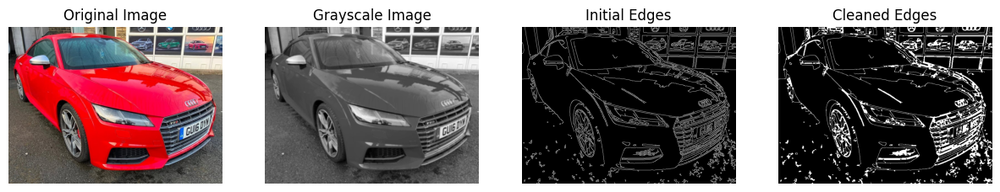

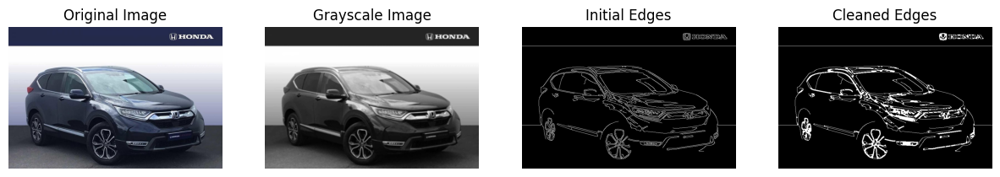

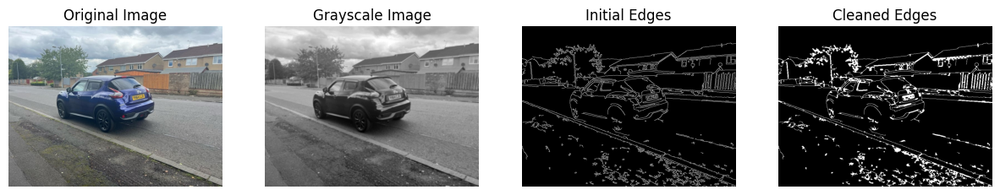

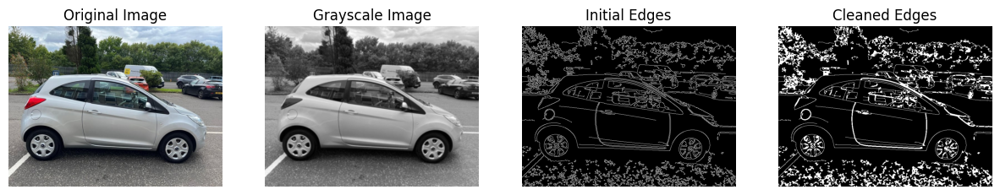

In [20]:


# Function for Canny edge detection
def apply_canny_edge_detection(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve edge detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Apply Canny edge detection
    edges = cv2.Canny(blurred, 50, 150)

    # Display the original, grayscale, and initial edges
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(blurred, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(edges, cmap='gray')
    plt.title('Initial Edges')
    plt.axis('off')

    # Apply morphological operations (dilation and erosion) to clean up edges
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    edges_cleaned = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    # Display the cleaned edges
    plt.subplot(1, 4, 4)
    plt.imshow(edges_cleaned, cmap='gray')
    plt.title('Cleaned Edges')
    plt.axis('off')

    plt.show()

    return edges_cleaned

# Main path to the folder containing subfolders
main_path = '/content/drive/MyDrive/cars'

# List all subfolders
subfolders = [f for f in os.listdir(main_path) if os.path.isdir(os.path.join(main_path, f))]

# Loop through each subfolder
for subfolder in subfolders:
    subfolder_path = os.path.join(main_path, subfolder)

    # List all image files in the subfolder
    image_files = [f for f in os.listdir(subfolder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Get 5 random images from the subfolder
    random_images = random.sample(image_files, min(5, len(image_files)))

    # Display original, grayscale, initial edges, and cleaned edges for 5 random images from the subfolder
    print(f"\nClass: {subfolder}")
    for img_file in random_images:
        img_path = os.path.join(subfolder_path, img_file)
        img = cv2.imread(img_path)

        # Apply Canny edge detection and display intermediate steps
        edges_cleaned = apply_canny_edge_detection(img)


#Evaluate


Class: train


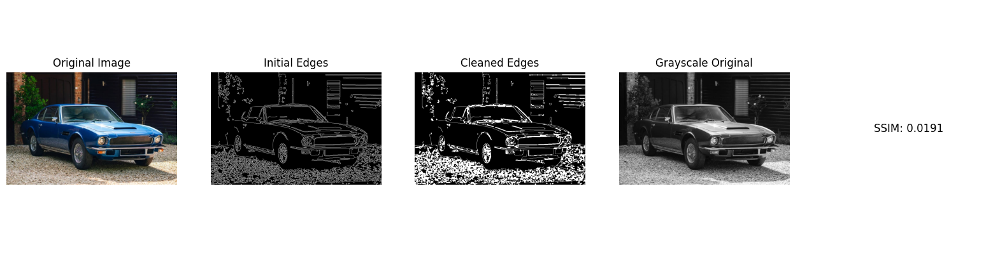

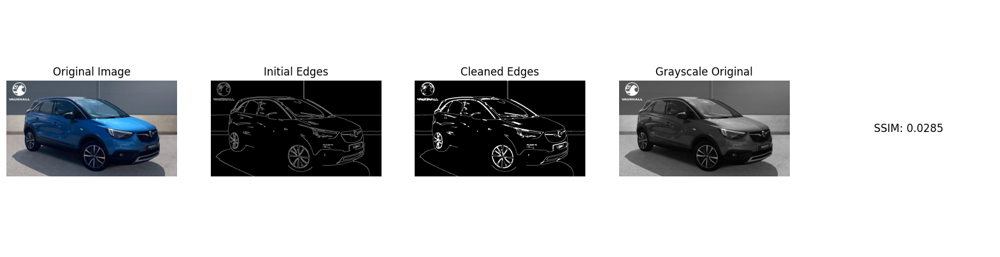

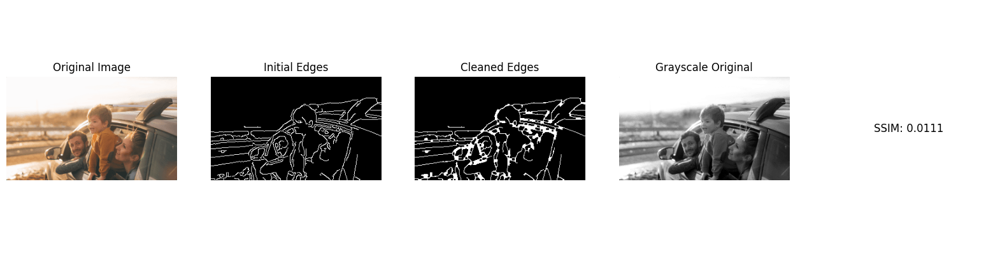

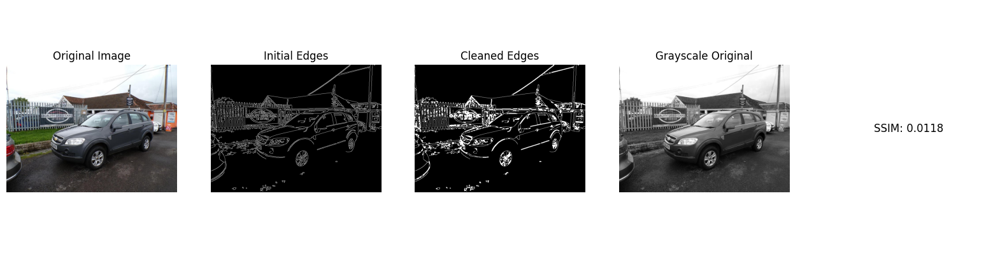

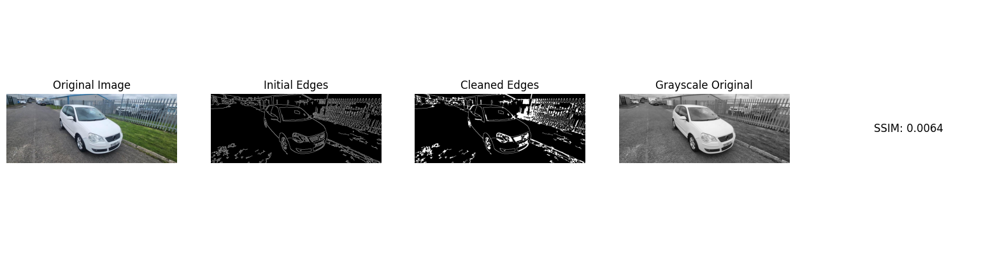


Class: test


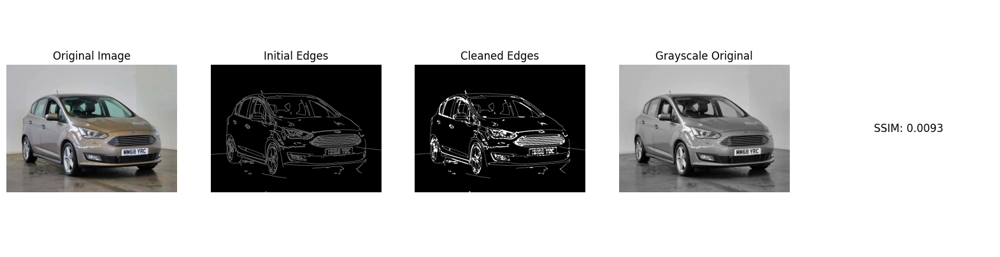

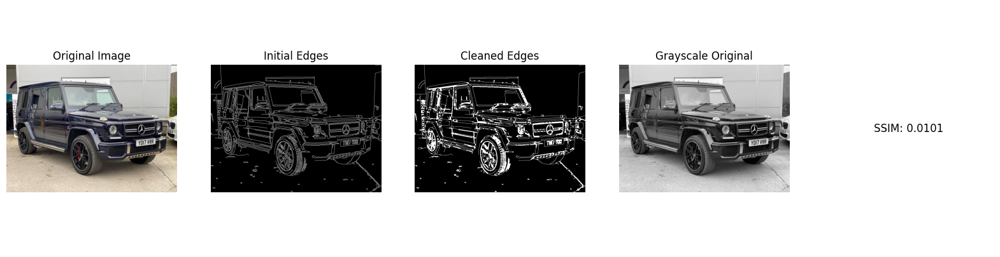

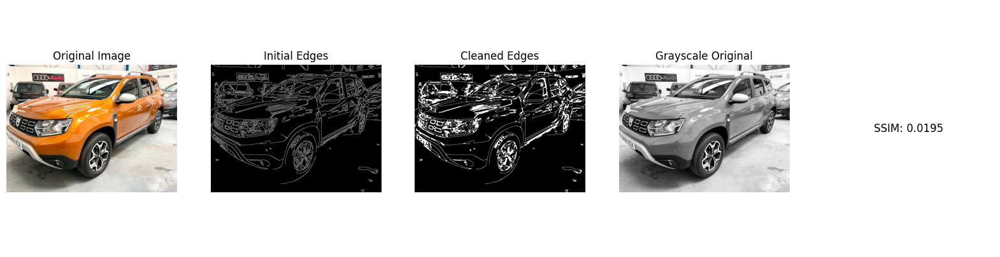

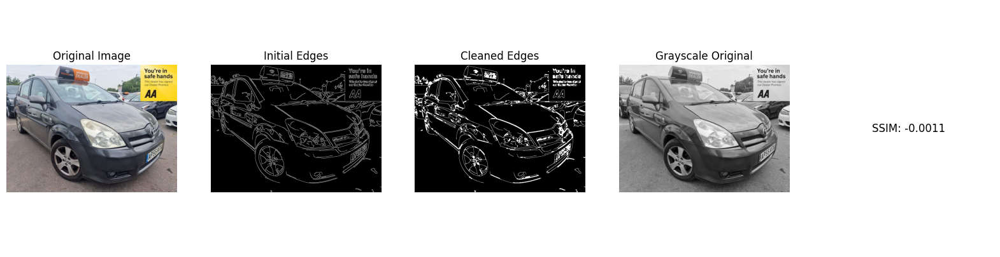

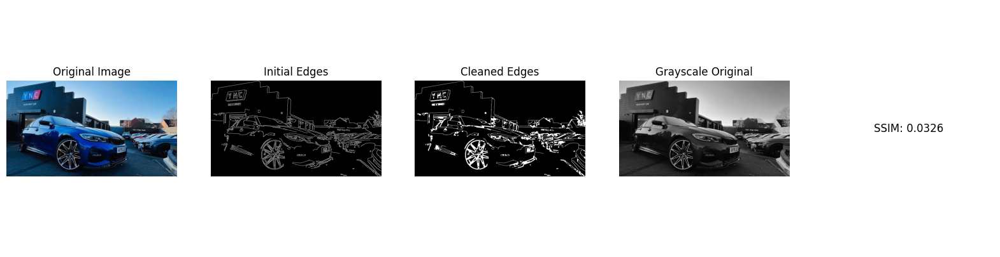

In [23]:


# Loop through each subfolder
for subfolder in subfolders:
    subfolder_path = os.path.join(main_path, subfolder)

    # List all image files in the subfolder
    image_files = [f for f in os.listdir(subfolder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Get 5 random images from the subfolder
    random_images = random.sample(image_files, min(5, len(image_files)))

    # Display original, grayscale, initial edges, cleaned edges, and SSIM for 5 random images from the subfolder
    print(f"\nClass: {subfolder}")
    for img_file in random_images:
        img_path = os.path.join(subfolder_path, img_file)
        img = cv2.imread(img_path)

        # Apply Canny edge detection and display intermediate steps
        edges, edges_cleaned = apply_canny_edge_detection(img)

        # Display original, grayscale, initial edges, cleaned edges
        plt.figure(figsize=(20, 5))

        plt.subplot(1, 5, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.imshow(edges, cmap='gray')
        plt.title('Initial Edges')
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(edges_cleaned, cmap='gray')
        plt.title('Cleaned Edges')
        plt.axis('off')

        # Compute and display SSIM
        original_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ssim_score = ssim(original_gray, edges_cleaned)

        plt.subplot(1, 5, 4)
        plt.imshow(original_gray, cmap='gray')
        plt.title('Grayscale Original')
        plt.axis('off')

        plt.subplot(1, 5, 5)
        plt.text(0.5, 0.5, f'SSIM: {ssim_score:.4f}', fontsize=12, ha='center', va='center')
        plt.axis('off')

        plt.show()


The Structural Similarity Index (SSI) is a metric used to measure the similarity between two images. It considers luminance, contrast, and structure, providing a score between -1 and 1. A higher SSIM score indicates a higher similarity between the two images. Here's how to interpret SSIM scores:

1. **Perfect Similarity (SSIM = 1):**
   - If the SSIM score is 1, it means the two images are identical in terms of luminance, contrast, and structure. The higher the SSIM value, the closer the images are in terms of perceived quality.

2. **Good Similarity (0.75 < SSIM < 1):**
   - SSIM values between 0.75 and 1 indicate good similarity. While not perfect, the images are considered similar with some minor differences.

3. **Moderate Similarity (0.5 < SSIM < 0.75):**
   - SSIM values in this range suggest a moderate level of similarity. There are noticeable differences between the images, but they share some structural similarities.

4. **Low Similarity (0.25 < SSIM < 0.5):**
   - SSIM values between 0.25 and 0.5 indicate low similarity. The images have significant differences in terms of luminance, contrast, and structure.

5. **No Similarity (SSIM < 0.25):**
   - If the SSIM score is very close to or less than 0, it implies that there is little to no similarity between the two images.

When using SSIM in the context of edge detection:

- A higher SSIM score between the original and the detected/cleaned edges suggests that the detected edges preserve the structural information well.

- Monitoring SSIM scores during the development of an image processing pipeline can help ensure that modifications (such as edge detection and cleaning) do not significantly alter the perceived quality of the images.

Keep in mind that SSIM is just one metric, and its interpretation should be considered along with other relevant metrics and visual inspection of the images. It is particularly useful when evaluating the perceptual quality of images and the impact of image processing operations.